In [133]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yaml

config = yaml.load(open('../config/full_images_to_hist_config.yaml', 'r'), Loader=yaml.FullLoader)
n_bins = config['clusterization_config']['n_clusters']

In [134]:
df = pd.read_csv('../dataset/total_histogram_CNN.csv')
df

,image_name,histogram,features_CNN
0,0_430b273cb7915d83.jpg,[0.00891516 0.01386802 0.00924535 0.00891516 0...,"[0.029053612, 0.005296911, 0.04431615, 8.36852..."
1,0_8c54ccf63a12ee74.jpg,[0.01114108 0.00788027 0.00652161 0.00679334 0...,"[0.02466255, 0.000653582, 0.028425196, 0.00015..."
2,0_c8f198d7da690cc8.jpg,[0.00954264 0.0126586 0.0085689 0.00837415 0...,"[0.026438147, 0.0029341085, 0.03634543, -0.002..."
3,100001.jpg,[0.00292408 0.00988136 0.0033274 0.00846974 0...,"[0.029428592, 0.00525929, 0.044686396, 0.00075..."
4,1000_nm1265067_rm1814797056_1975-7-6_2006.jpg,[0.0123984 0. 0.0247968 0. 0...,"[0.011611224, 0.007402856, 0.045435827, -0.002..."
...,...,...,...
13486,9_2880a8b6f793718b.jpg,[0.00515493 0.01153723 0.00957345 0.00589135 0...,"[0.024701158, 0.0011192564, 0.022922888, -0.00..."
13487,9_3132ef918ba51ab2.jpg,[0.0041328 0.0078064 0.006888 0.0032144 0...,"[0.018829633, 0.0005661463, 0.01457021, -0.005..."
13488,9_a375246edbdf075f.jpg,[0.00558239 0.00580569 0.01272785 0.00491251 0...,"[0.01585649, 0.0015101983, 0.0134944385, -0.00..."
13489,9_ae96695dd68be0b5.jpg,[0.00671726 0.01200965 0.01139899 0.00732792 0...,"[0.017618159, 0.00042408812, 0.013445612, -0.0..."


In [135]:
def get_hist_from_str(value, separator):
    hist = str(value).strip().replace('[','').replace(']','').replace("\n","").split(separator)
    hist = [i for i in hist if i != '']
    hist = np.array(hist, dtype=np.float32)
    return hist

In [136]:
def get_hist(value):
    hist = str(value).strip().replace('[','').replace(']','').replace("\n","").split(" ")
    hist = [i for i in hist if i != '']
    hist = np.array(hist, dtype=np.float32)
    return hist

In [137]:
def plot_histogram(df, index):
    hist = get_hist(df["histogram"][index])
    x = np.arange(0, n_bins)
    plt.bar(x, hist)
    plt.title("Histogram")
    plt.xlabel("Quantized Value")
    plt.ylabel("Frequency")
    plt.show()


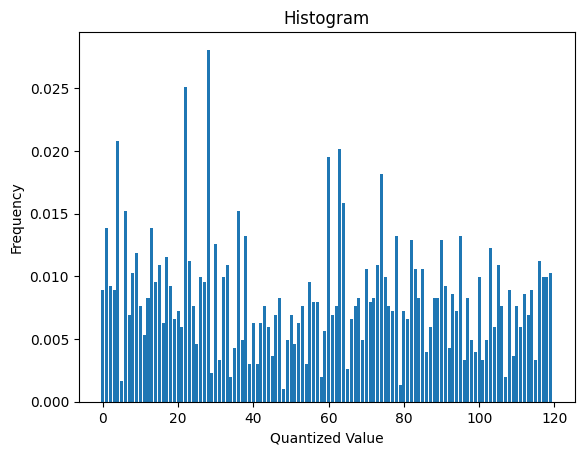

In [138]:
plot_histogram(df, 0)

In [139]:
def similarity_metric(vec_1,vec_2, measure = 'euclidean'):
    if measure == 'euclidean':
        resta = vec_1 - vec_2
        return np.sqrt(np.sum(resta**2))
    elif measure == 'manhattan':
        resta = vec_1 - vec_2
        return np.sum(np.abs(resta))
    elif measure == 'cosine':
        dot_product = np.dot(vec_1, vec_2)
        norm_a = np.linalg.norm(vec_1)
        norm_b = np.linalg.norm(vec_2)
        cosine_similarity = dot_product / (norm_a * norm_b)
        return 1 - cosine_similarity
    else:
        raise ValueError(f"Unknown measure: {measure}")

In [140]:
# import module from other directory
import sys
sys.path.insert(1, '../')

from src.SIFT.SIFT_gen_and_utils import SIFTFeatures

SIFT = SIFTFeatures("", "", run=False)
image_example = df["image_name"][999]
image_class = SIFT.get_class(image_example)
image_class

'214_type2'

In [141]:
# get all images from the same class
df["class"] = df["image_name"].apply(lambda x: SIFT.get_class(x))

df["features_histogram"] = df["histogram"].apply(lambda x: get_hist(x))

df["features_CNN"] = df["features_CNN"].apply(lambda x: get_hist_from_str(x, ","))


In [142]:
df

,image_name,histogram,features_CNN,class,features_histogram
0,0_430b273cb7915d83.jpg,[0.00891516 0.01386802 0.00924535 0.00891516 0...,"[0.029053612, 0.005296911, 0.04431615, 8.36852...",0_type1,"[0.00891516, 0.01386802, 0.00924535, 0.0089151..."
1,0_8c54ccf63a12ee74.jpg,[0.01114108 0.00788027 0.00652161 0.00679334 0...,"[0.02466255, 0.000653582, 0.028425196, 0.00015...",0_type1,"[0.01114108, 0.00788027, 0.00652161, 0.0067933..."
2,0_c8f198d7da690cc8.jpg,[0.00954264 0.0126586 0.0085689 0.00837415 0...,"[0.026438147, 0.0029341085, 0.03634543, -0.002...",0_type1,"[0.00954264, 0.0126586, 0.0085689, 0.00837415,..."
3,100001.jpg,[0.00292408 0.00988136 0.0033274 0.00846974 0...,"[0.029428592, 0.00525929, 0.044686396, 0.00075...",0_type2,"[0.00292408, 0.00988136, 0.0033274, 0.00846974..."
4,1000_nm1265067_rm1814797056_1975-7-6_2006.jpg,[0.0123984 0. 0.0247968 0. 0...,"[0.011611224, 0.007402856, 0.045435827, -0.002...",1000_type1,"[0.0123984, 0.0, 0.0247968, 0.0, 0.0, 0.004132..."
...,...,...,...,...,...
13486,9_2880a8b6f793718b.jpg,[0.00515493 0.01153723 0.00957345 0.00589135 0...,"[0.024701158, 0.0011192564, 0.022922888, -0.00...",9_type1,"[0.00515493, 0.01153723, 0.00957345, 0.0058913..."
13487,9_3132ef918ba51ab2.jpg,[0.0041328 0.0078064 0.006888 0.0032144 0...,"[0.018829633, 0.0005661463, 0.01457021, -0.005...",9_type1,"[0.0041328, 0.0078064, 0.006888, 0.0032144, 0...."
13488,9_a375246edbdf075f.jpg,[0.00558239 0.00580569 0.01272785 0.00491251 0...,"[0.01585649, 0.0015101983, 0.0134944385, -0.00...",9_type1,"[0.00558239, 0.00580569, 0.01272785, 0.0049125..."
13489,9_ae96695dd68be0b5.jpg,[0.00671726 0.01200965 0.01139899 0.00732792 0...,"[0.017618159, 0.00042408812, 0.013445612, -0.0...",9_type1,"[0.00671726, 0.01200965, 0.01139899, 0.0073279..."


In [125]:
import tqdm
# create a similarity matrix for each image
def similarity_matrix(df, measure="cosine", feature_type = "histogram"):
    # create a matrix of zeros
    similarity_matrix = np.zeros((len(df), len(df)))
    # iterate over each image
    for i in tqdm.tqdm(range(len(df))):
        # get the image name
        image_name = df["image_name"][i]
        # calculate the similarity with the rest of images
        for j in range(len(df)):
            # get the image name
            image_name_2 = df["image_name"][j]
            if similarity_matrix[j,i] != 0:
                similarity_matrix[i, j] = similarity_matrix[j,i]
                continue
            if image_name == image_name_2:
                similarity_matrix[i, j] = 0
                continue
            # calculate the similarity
            similarity_matrix[i, j] = similarity_metric(df[f"features_{feature_type}"][i], df[f"features_{feature_type}"][j], measure=measure)
    return similarity_matrix

#matrix = similarity_matrix(df, measure="euclidean", feature_type = "histogram")
matrix_cnn = similarity_matrix(df, measure="euclidean", feature_type = "CNN")

100%|██████████| 13491/13491 [38:54<00:00,  5.78it/s] 


In [126]:
import joblib
#joblib.dump(matrix, "../dataset/similarity_matrix_histogram.pkl")
joblib.dump(matrix_cnn, "../dataset/similarity_matrix_cnn.pkl")
matrix_cnn

array([[0.        , 0.57635069, 0.28857875, ..., 0.76624221, 0.76619613,
        0.86151338],
       [0.57635069, 0.        , 0.34135759, ..., 0.37636894, 0.41639376,
        0.46754754],
       [0.28857875, 0.34135759, 0.        , ..., 0.52462089, 0.53274268,
        0.62273628],
       ...,
       [0.76624221, 0.37636894, 0.52462089, ..., 0.        , 0.18313505,
        0.18712464],
       [0.76619613, 0.41639376, 0.53274268, ..., 0.18313505, 0.        ,
        0.18633606],
       [0.86151338, 0.46754754, 0.62273628, ..., 0.18712464, 0.18633606,
        0.        ]])

In [143]:
import joblib
matrix = joblib.load("../dataset/similarity_matrix_histogram.pkl")
matrix

array([[0.        , 0.06628722, 0.05987192, ..., 0.06196955, 0.03750617,
        0.05437732],
       [0.06628722, 0.        , 0.02919658, ..., 0.07483669, 0.05703997,
        0.05590313],
       [0.05987192, 0.02919658, 0.        , ..., 0.06800602, 0.04971512,
        0.04724106],
       ...,
       [0.06196955, 0.07483669, 0.06800602, ..., 0.        , 0.04553069,
        0.03771284],
       [0.03750617, 0.05703997, 0.04971512, ..., 0.04553069, 0.        ,
        0.03397393],
       [0.05437732, 0.05590313, 0.04724106, ..., 0.03771284, 0.03397393,
        0.        ]])

In [144]:
matrix_cnn = joblib.load("../dataset/similarity_matrix_CNN.pkl")
matrix_cnn

array([[0.        , 0.57635069, 0.28857875, ..., 0.76624221, 0.76619613,
        0.86151338],
       [0.57635069, 0.        , 0.34135759, ..., 0.37636894, 0.41639376,
        0.46754754],
       [0.28857875, 0.34135759, 0.        , ..., 0.52462089, 0.53274268,
        0.62273628],
       ...,
       [0.76624221, 0.37636894, 0.52462089, ..., 0.        , 0.18313505,
        0.18712464],
       [0.76619613, 0.41639376, 0.53274268, ..., 0.18313505, 0.        ,
        0.18633606],
       [0.86151338, 0.46754754, 0.62273628, ..., 0.18712464, 0.18633606,
        0.        ]])

In [23]:
def query_image(df, image_name, measure="euclidean", feature_type = "CNN"):
    df["similarity"] = df[f"features_{feature_type}"].apply(lambda x: similarity_metric(x, df[df["image_name"] == image_name][f"features_{feature_type}"].values[0], measure=measure))
    df = df.sort_values(by=['similarity'])
    df = df.reset_index(drop=True)
    return df

In [127]:
def query_image(df, matrix, query_image):
    # get the index of the query image
    index = df[df["image_name"] == query_image].index.values[0]
    # get the similarity vector
    similarity_vector = matrix[index]
    # create a dataframe
    df_query = pd.DataFrame({"image_name": df["image_name"], "similarity": similarity_vector, "class": df["class"]})
    # sort the dataframe
    df_query = df_query.sort_values(by=['similarity'])
    df_query = df_query.reset_index(drop=True)
    return df_query


df_query = query_image(df, matrix_cnn, image_example)
df_query

,image_name,similarity,class
0,0_430b273cb7915d83.jpg,0.000000,0_type1
1,128400.jpg,0.094331,284_type2
2,134300.jpg,0.097636,343_type2
3,113300.jpg,0.102968,133_type2
4,107700.jpg,0.109970,77_type2
...,...,...,...
13486,1188_nm1343003_rm583441152_1974-1-7_2006.jpg,1.718142,1188_type1
13487,1172_nm0327779_rm3376132352_1979-6-30_2005.jpg,1.719603,1172_type1
13488,764_048.jpg,1.719779,764_type1
13489,739_016.jpg,1.721764,739_type1


In [146]:
df

,image_name,histogram,features_CNN,class,features_histogram,Nrank_histogram,Nrank_CNN
0,0_430b273cb7915d83.jpg,[0.00891516 0.01386802 0.00924535 0.00891516 0...,"[0.029053612, 0.005296911, 0.04431615, 8.36852...",0_type1,"[0.00891516, 0.01386802, 0.00924535, 0.0089151...",0.065015,0.125919
1,0_8c54ccf63a12ee74.jpg,[0.01114108 0.00788027 0.00652161 0.00679334 0...,"[0.02466255, 0.000653582, 0.028425196, 0.00015...",0_type1,"[0.01114108, 0.00788027, 0.00652161, 0.0067933...",0.053435,0.086148
2,0_c8f198d7da690cc8.jpg,[0.00954264 0.0126586 0.0085689 0.00837415 0...,"[0.026438147, 0.0029341085, 0.03634543, -0.002...",0_type1,"[0.00954264, 0.0126586, 0.0085689, 0.00837415,...",0.050626,0.054654
3,100001.jpg,[0.00292408 0.00988136 0.0033274 0.00846974 0...,"[0.029428592, 0.00525929, 0.044686396, 0.00075...",0_type2,"[0.00292408, 0.00988136, 0.0033274, 0.00846974...",0.000593,0.167111
4,1000_nm1265067_rm1814797056_1975-7-6_2006.jpg,[0.0123984 0. 0.0247968 0. 0...,"[0.011611224, 0.007402856, 0.045435827, -0.002...",1000_type1,"[0.0123984, 0.0, 0.0247968, 0.0, 0.0, 0.004132...",0.595978,0.708118
...,...,...,...,...,...,...,...
13486,9_2880a8b6f793718b.jpg,[0.00515493 0.01153723 0.00957345 0.00589135 0...,"[0.024701158, 0.0011192564, 0.022922888, -0.00...",9_type1,"[0.00515493, 0.01153723, 0.00957345, 0.0058913...",0.036946,0.046895
13487,9_3132ef918ba51ab2.jpg,[0.0041328 0.0078064 0.006888 0.0032144 0...,"[0.018829633, 0.0005661463, 0.01457021, -0.005...",9_type1,"[0.0041328, 0.0078064, 0.006888, 0.0032144, 0....",0.010229,0.032656
13488,9_a375246edbdf075f.jpg,[0.00558239 0.00580569 0.01272785 0.00491251 0...,"[0.01585649, 0.0015101983, 0.0134944385, -0.00...",9_type1,"[0.00558239, 0.00580569, 0.01272785, 0.0049125...",0.003616,0.035900
13489,9_ae96695dd68be0b5.jpg,[0.00671726 0.01200965 0.01139899 0.00732792 0...,"[0.017618159, 0.00042408812, 0.013445612, -0.0...",9_type1,"[0.00671726, 0.01200965, 0.01139899, 0.0073279...",0.021479,0.028678


In [128]:
image_example = df["image_name"][0]
df_query = query_image(df, matrix_cnn, image_example)
df_query

,image_name,similarity,class
0,0_430b273cb7915d83.jpg,0.000000,0_type1
1,128400.jpg,0.094331,284_type2
2,134300.jpg,0.097636,343_type2
3,113300.jpg,0.102968,133_type2
4,107700.jpg,0.109970,77_type2
...,...,...,...
13486,1188_nm1343003_rm583441152_1974-1-7_2006.jpg,1.718142,1188_type1
13487,1172_nm0327779_rm3376132352_1979-6-30_2005.jpg,1.719603,1172_type1
13488,764_048.jpg,1.719779,764_type1
13489,739_016.jpg,1.721764,739_type1


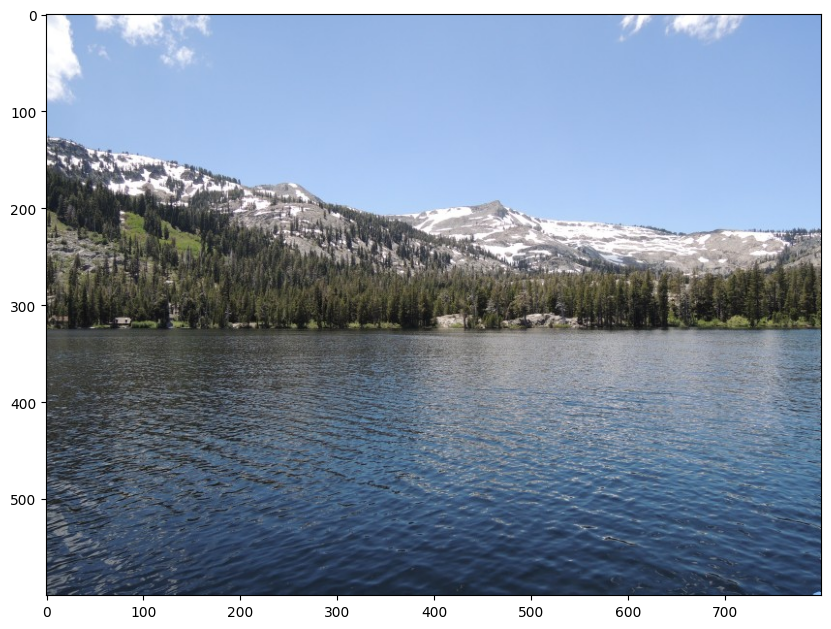

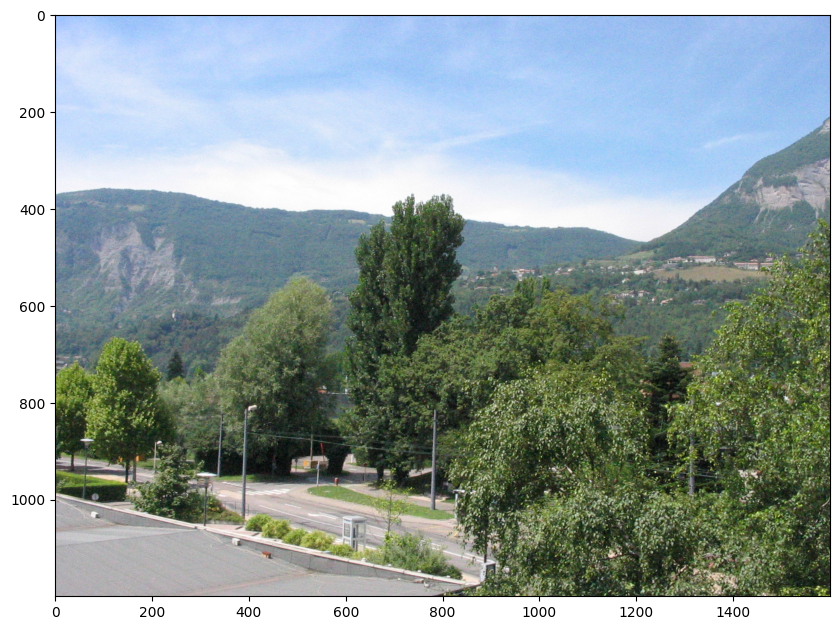

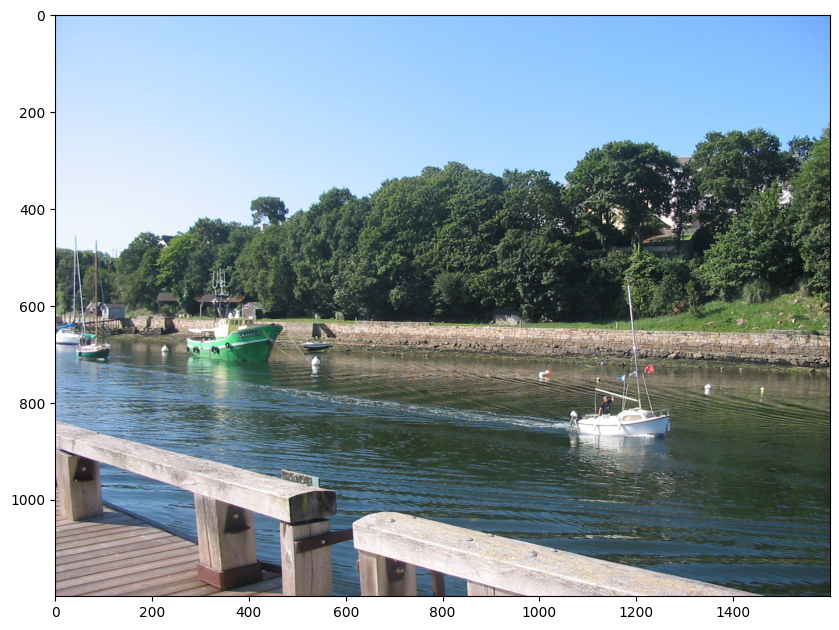

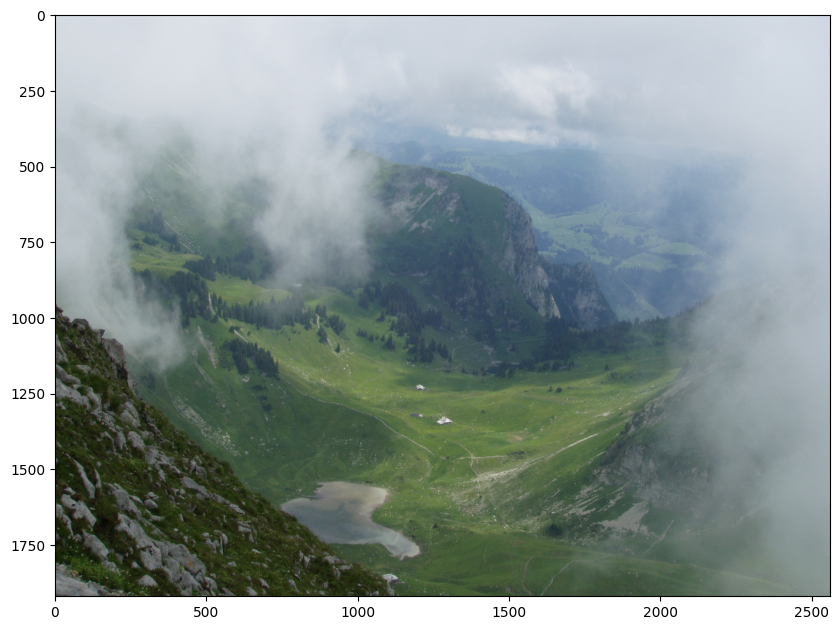

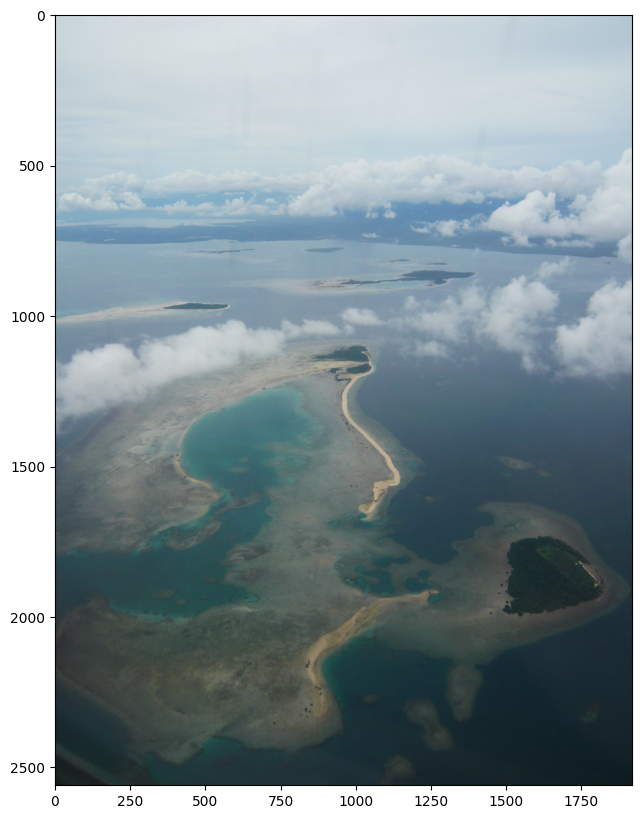

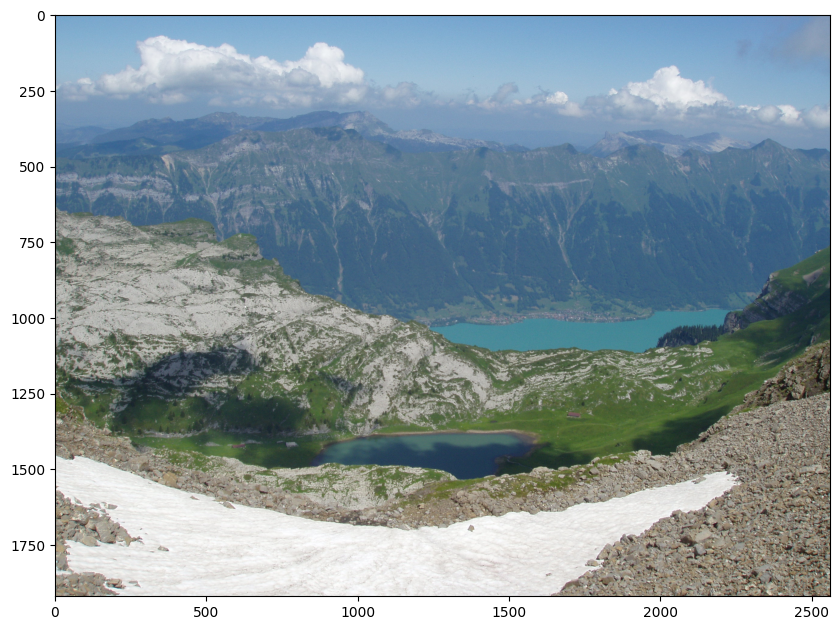

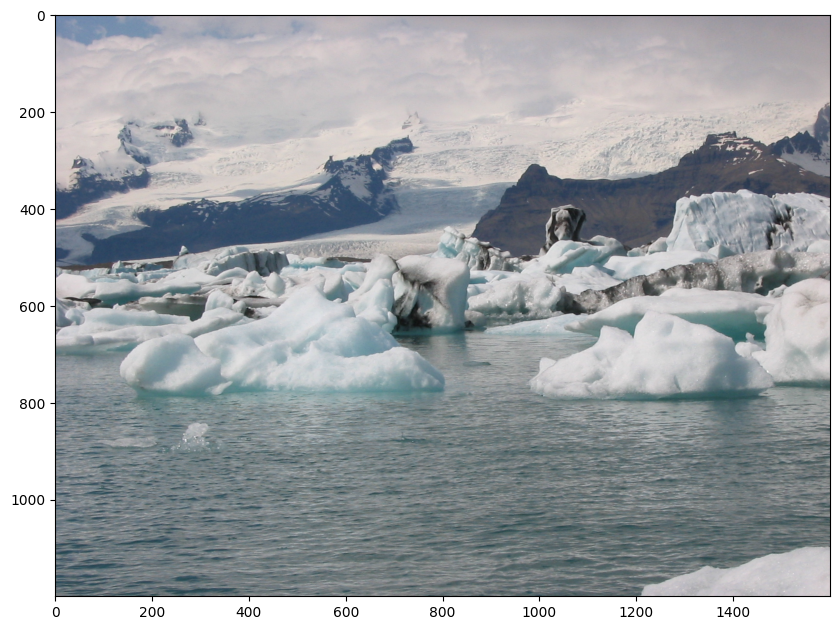

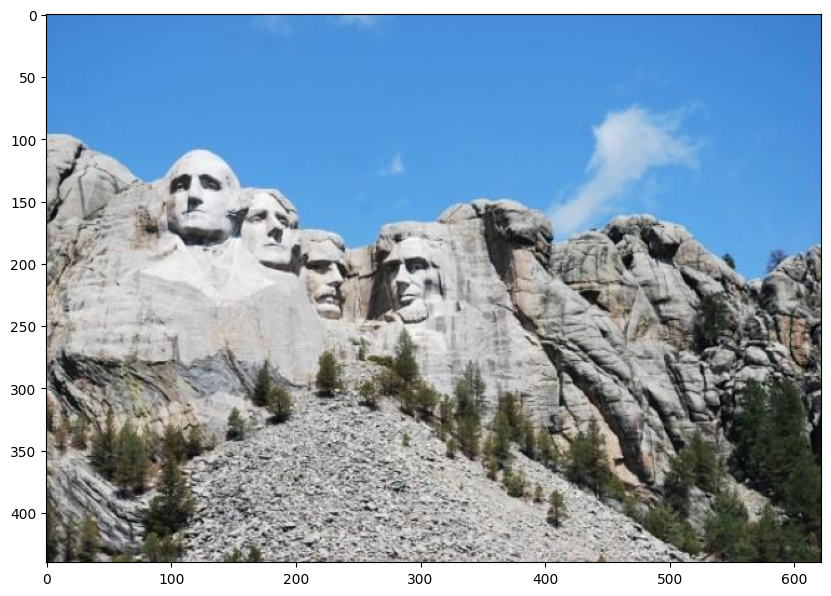

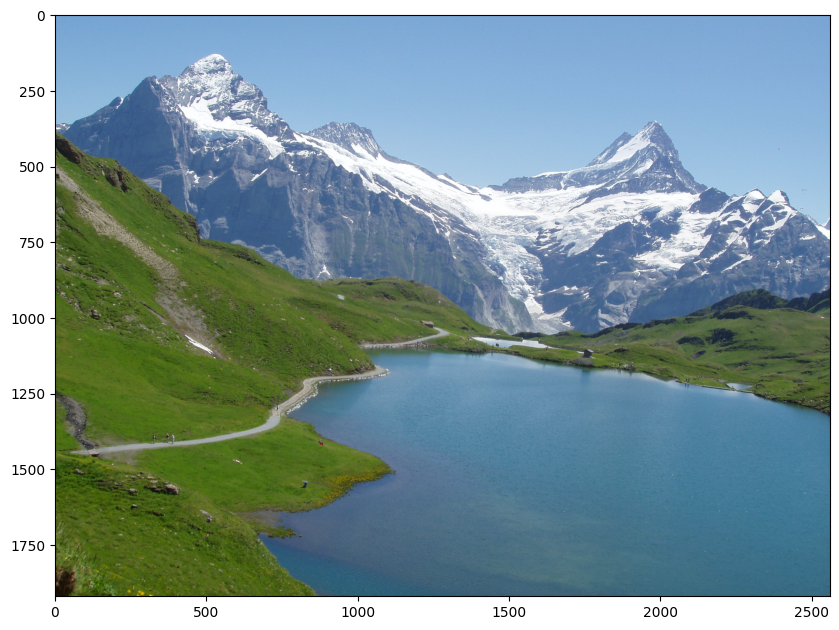

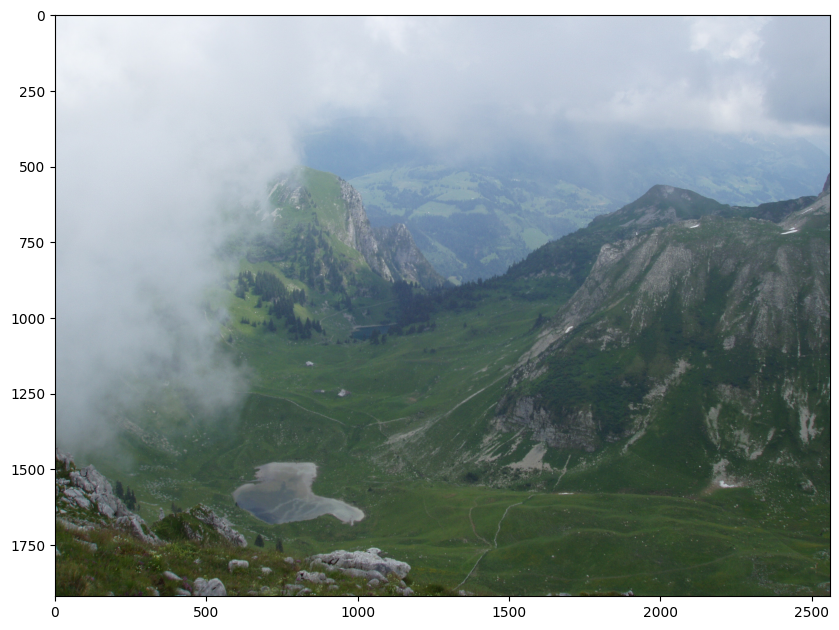

In [129]:
# plot the most similar images
from PIL import Image
def plot_images(df_, index):
    plt.figure(figsize=(10, 10))
    plt.imshow(Image.open(f'../dataset/total/{df_["image_name"][index]}'))
    plt.show()


for i in range(0, 10):
    #print(df["similarity"][i])
    #print(df["image_name"][i])
    plot_images(df_query, i)


In [31]:
# count how many different classes are
df["class"].nunique()

1700

In [16]:
# evaluating ranking method
def evaluate_query(df, matrix, image_query, normalized=True):
    # obtener la clase de la imagen
    image_class = SIFT.get_class(image_query)
    #print(image_class)
    # calcular similudes
    df_query = query_image(df, matrix, image_query)
    #print(df.columns)
    # obtener los indices de las imagenes de la misma clase
    indexes = df_query[df_query["class"] == image_class].index.values.tolist()
    #print(indexes)
    n_rel = len(indexes) - 1

    if normalized:
        N = len(df)
        return 1/(n_rel*N) * (sum(indexes) - (n_rel*(n_rel+1))/2)

    return 1/n_rel * sum(indexes)

image_example = df["image_name"][0]
evaluate_query(df, matrix, image_example, normalized=True)


0.06501453643993116

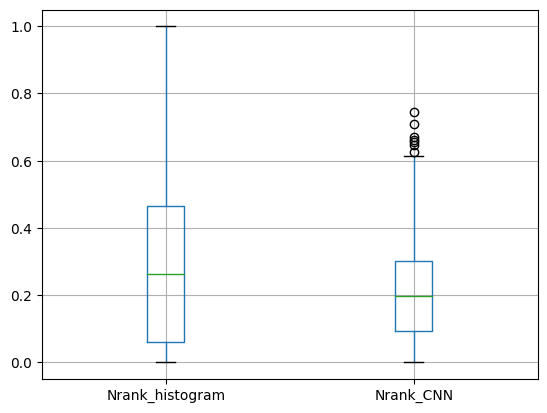

In [148]:
# import tqdm
# for i in tqdm.tqdm(range(len(df))):
#     row = df.iloc[i,:]
#     df.loc[i, "Nrank_handcrafted"] = evaluate_query(df, matrix, row["image_name"], normalized=True)
#
# for i in tqdm.tqdm(range(len(df))):
#     row = df.iloc[i,:]
#     df.loc[i, "Nrank_CNN"] = evaluate_query(df, matrix_cnn, row["image_name"], normalized=True)

# drop non numeric columns
df_grouped = df.drop(["image_name", "histogram"], axis=1)
#df_grouped = df.drop(["image_name"], axis=1)
# group by class
df_grouped = df_grouped.groupby("class").mean()
# generate a box plot for each column
df_grouped.boxplot()
plt.show()


In [21]:
# get the class with more elements
df["class"].value_counts().median()

10.0

In [115]:
# calculate precision and recall
def precision_recall(df, matrix, image_query, N=10):
    # obtener la clase de la imagen
    image_class = SIFT.get_class(image_query)
    #print(image_class)
    # calcular similudes
    df_query = query_image(df, matrix, image_query)
    #print(df_query)
    #print(df.columns)
    #N_rel = len(df_query[df_query["class"] == image_class])
    #print(N_rel)
    # get the top 10 images
    top_10 = df_query.iloc[1:N+1,:]
    # calculate TP
    TP = len(top_10[top_10["class"] == image_class])
    # calculate FP
    FP = len(top_10[top_10["class"] != image_class])
    # calculate FN
    FN = len(df_query[df_query["class"] == image_class]) - TP

    #print(TP, FP, FN)
    # calculate precision
    precision = TP/(TP+FP)
    # calculate recall
    recall = TP/(TP+FN)
    return precision, recall

image_example = df["image_name"][0]
precision_recall(df, matrix, image_example)


(0.0, 0.0)

100%|██████████| 10/10 [13:41<00:00, 82.15s/it]


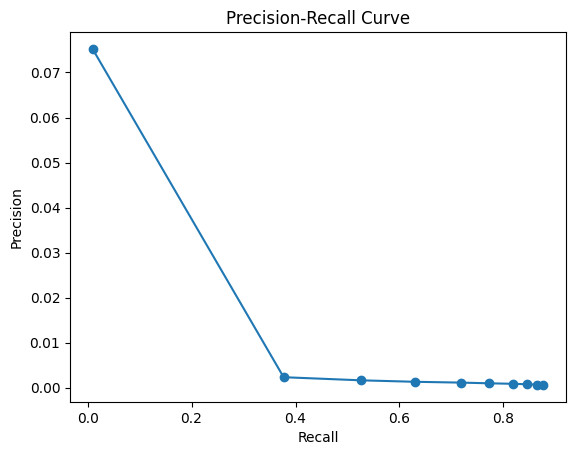

In [132]:
# calculate precision and recall for generating a
# precision recall graph for macro average
# to generate each point of the graph sweep the N parameter in a linspace from 3 to 13641
# (number of images in the dataset) make 30 points
# for each point calculate the precision and recall and then calculate the mean

import tqdm
import numpy as np
N = np.linspace(1, len(df), 10)
precision = []
recall = []
for N_ in tqdm.tqdm(N):
    precision_aux = 0
    recall_aux = 0
    for i in range(len(df)):
        row = df.iloc[i,:]
        precision_, recall_ = precision_recall(df, matrix_cnn, row["image_name"], N=int(N_))
        precision_aux += precision_
        recall_aux += recall_
    precision.append(precision_aux/len(df))
    recall.append(recall_aux/len(df))

# plot the precision recall graph with dots in each point
plt.plot(recall, precision, "o-")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.show()



In [ ]:
from src.CNN.CNN_utils import model, CNN_method
import os
from PIL import Image
def load_single(path):
    image = Image.open(os.path.join(path))
    return image

CNN_method(load_single(f'../dataset/total/{df["image_name"][0]}'), model)

def apply_cnn(image, CNN_method):
    try:
        return CNN_method(image, model)
    except:
        return np.zeros(4096)

df["features_CNN"] = df["image_name"].apply(lambda x: apply_cnn(load_single(f'../dataset/total/{x}'), CNN_method), model)

